# CalTech 101

Now that we have learned how to do Transfer Learning, let's try to use it on larger Datasets. We will study the [CalTech101] dataset (http://www.vision.caltech.edu/Image_Datasets/Caltech101/) which contains 40 to 800 images from 101 categories. 

1. Import the classic librairies 

In [37]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms.v2 as transforms
import torchvision.datasets as datasets
from torchvision import models
from torch.utils.data import DataLoader
import shutil
import os
import json
import matplotlib.pyplot as plt

device = torch.accelerator.current_accelerator().type if torch.accelerator.is_available() else "cpu"
print(f"Using {device} device")

Using mps device


2. Using [`datasets.Caltech101`](https://pytorch.org/vision/main/generated/torchvision.datasets.Caltech101.html), download and extract the Caltech101 dataset.

In [2]:
datasets.Caltech101("caltech101",
                    download=True)

Downloading...
From (original): https://drive.google.com/uc?id=137RyRjvTBkBiIfeYBNZBtViDHQ6_Ewsp
From (redirected): https://drive.usercontent.google.com/download?id=137RyRjvTBkBiIfeYBNZBtViDHQ6_Ewsp&confirm=t&uuid=5a60310c-e4e4-4a15-9d6e-04293d7d4e1e
To: /Users/charlestanguy/Documents/FULL_STACK_DSE/M08-Deep_Learning/D05-Transfer_Learning/03-Instructors/01-Exercises_solutions/caltech101/caltech101/101_ObjectCategories.tar.gz
100%|██████████| 132M/132M [00:14<00:00, 9.38MB/s] 
Downloading...
From (original): https://drive.google.com/uc?id=175kQy3UsZ0wUEHZjqkUDdNVssr7bgh_m
From (redirected): https://drive.usercontent.google.com/download?id=175kQy3UsZ0wUEHZjqkUDdNVssr7bgh_m&confirm=t&uuid=c541c993-ae66-4e47-afe3-b2cad733729a
To: /Users/charlestanguy/Documents/FULL_STACK_DSE/M08-Deep_Learning/D05-Transfer_Learning/03-Instructors/01-Exercises_solutions/caltech101/caltech101/Annotations.tar
100%|██████████| 14.0M/14.0M [00:01<00:00, 11.2MB/s]


Dataset Caltech101
    Number of datapoints: 8677
    Root location: caltech101/caltech101
    Target type: ['category']

# Data Augmentation

We will now proceed to the preprocessing of our data. The easiest way to do so is using a composition of several transform functions from `torchvision.transforms.v2`.
The target shapes of our images should be `(299,299)`.

In [3]:

# Define transformations for data augmentation and normalization
transform = transforms.Compose([

    # Make sure images are converted to RGB format with 3 channels even if they are originally in grayscale
    transforms.RGB()

    # Randomly flip the image horizontally (left-right) with a probability of 50%
    transforms.RandomHorizontalFlip(),

    # Randomly flip the image vertically (up-down) with a probability of 50%
    transforms.RandomVerticalFlip(),

    # Randomly adjust brightness and contrast (±20% variation)
    transforms.ColorJitter(brightness=0.2, contrast=0.2),

    # Resize the image to match the required input size for models like InceptionV3 (299x299 pixels)
    transforms.Resize((299, 299)),

    # Convert the image to a PyTorch tensor (channels-first format: C x H x W)
    transforms.ToTensor(),

    # Normalize pixel values to range [-1, 1] using mean and standard deviation.
    # This helps improve model stability and training efficiency.
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])


/opt/anaconda3/envs/pytorch/lib/python3.10/site-packages/torchvision/transforms/v2/_deprecated.py:42: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.Output is equivalent up to float precision.
  warnings.warn(


2. Prepare two objects `train_loader` and `val_loader` using the `datasets.ImageFolder` class.
Form batches of 32 images, make sure you use an option to drop the last batch as you may run into trouble if the last bactch contains only one image. (You may leave the drop_last argument blank, and witness the thick opacity of the error message you'll get 🤭)

In [4]:
# Load dataset using ImageFolder
extract_dir = "./caltech101/caltech101/101_ObjectCategories"

# Load image from the folder unsing image folder
dataset = datasets.ImageFolder(root=extract_dir, transform=transform)

# split data into train and validation set
val_size = int(0.3 * len(dataset))
train_size = len(dataset) - val_size
train_dataset, val_dataset = torch.utils.data.random_split(dataset, [train_size, val_size])

# Create the data loaders for the train set and validation set
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, drop_last=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, drop_last=True)


3. Visualize a batch of images coming from the train set. Do you notice anyhting we will have to take into consideration when building the model?

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99215686].


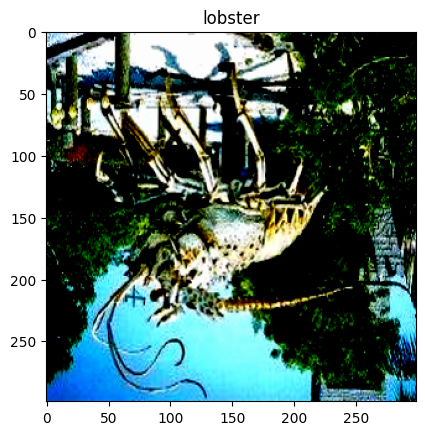

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99215686..0.9843137].


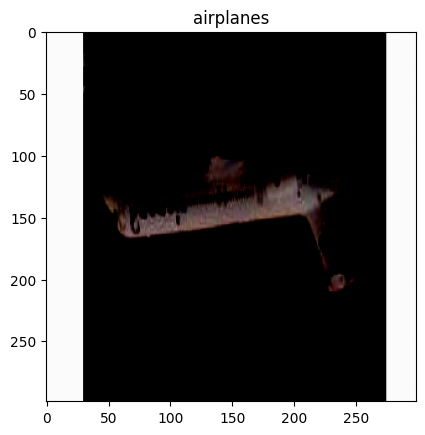

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.827451].


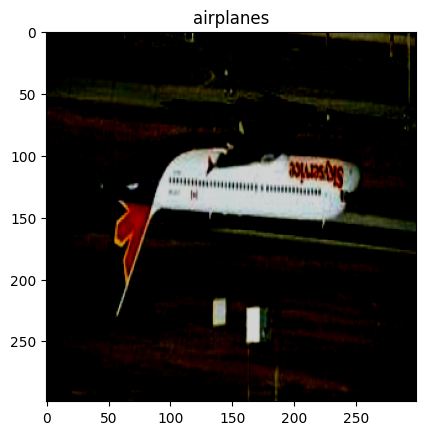

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9607843..0.7176471].


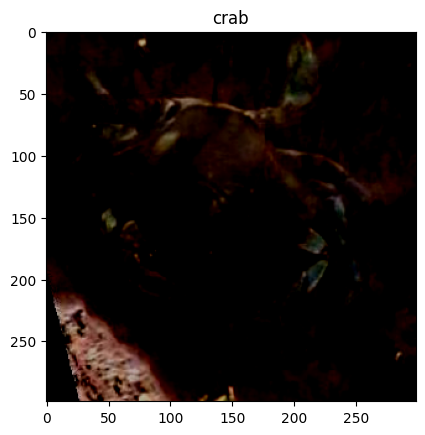

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.8666667].


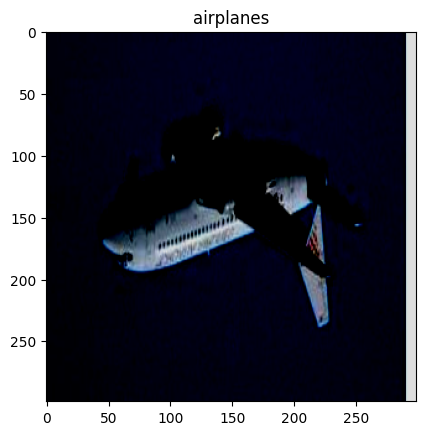

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.94509804..0.9372549].


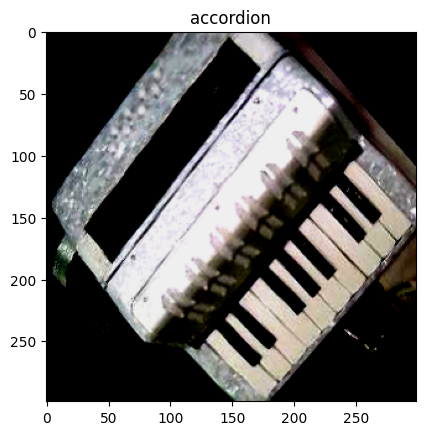

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9607843..0.5058824].


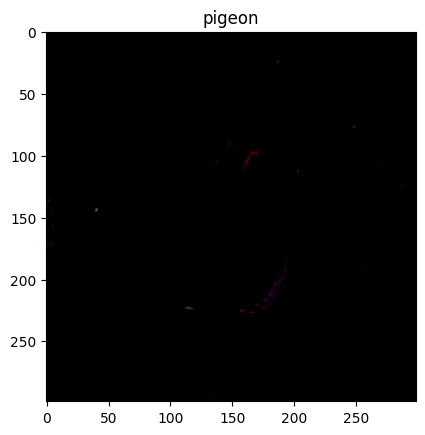

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.73333335..0.7254902].


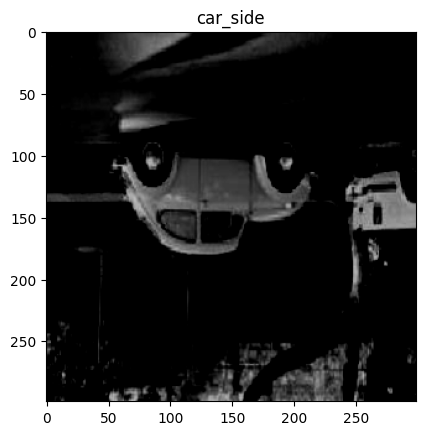

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


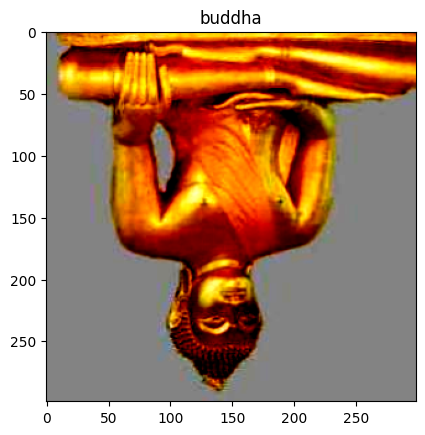

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


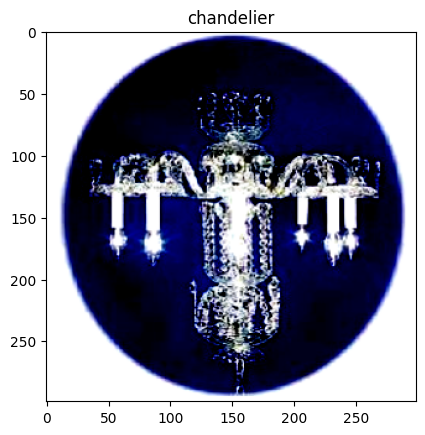

In [5]:
# Get class names
class_names = dataset.classes

# loop through a batch of images to plot them
imgs, labels = next(iter(train_loader))
for i,  (img, label)in enumerate(zip(imgs, labels)):
  true_label_name = class_names[label]
  plt.imshow(img.permute(1, 2, 0).numpy()) # permute the dimensions so channels are last
  plt.title(true_label_name)
  plt.show()
  if i == 9: break

# Transfer Learning

1. Import a pretrained model from tensorflow, the solution will use the example of <a href="https://pytorch.org/vision/main/models/generated/torchvision.models.inception_v3.html"> InceptionV3 </a>, but feel free to use different architecture if you would like to get a different point of view. Make sure you use the pretrained weights from `imagenet`.

In [7]:
# Load a pre-trained model (Inception v3) with imagenet weights
model = models.inception_v3(weights="IMAGENET1K_V1")


In [8]:
print(model)

Inception3(
  (Conv2d_1a_3x3): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2a_3x3): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2b_3x3): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Conv2d_3b_1x1): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_4a_3x3): BasicConv2d(
    (conv): Conv2d(80, 192, kernel_size=(3, 3), stri

In [9]:
from torchinfo import summary

# Print model summary
summary(model, input_size=(1, 3, 299, 299))  # (batch_size, input_features)

Layer (type:depth-idx)                   Output Shape              Param #
Inception3                               [1, 1000]                 3,326,696
├─BasicConv2d: 1-1                       [1, 32, 149, 149]         --
│    └─Conv2d: 2-1                       [1, 32, 149, 149]         864
│    └─BatchNorm2d: 2-2                  [1, 32, 149, 149]         64
├─BasicConv2d: 1-2                       [1, 32, 147, 147]         --
│    └─Conv2d: 2-3                       [1, 32, 147, 147]         9,216
│    └─BatchNorm2d: 2-4                  [1, 32, 147, 147]         64
├─BasicConv2d: 1-3                       [1, 64, 147, 147]         --
│    └─Conv2d: 2-5                       [1, 64, 147, 147]         18,432
│    └─BatchNorm2d: 2-6                  [1, 64, 147, 147]         128
├─MaxPool2d: 1-4                         [1, 64, 73, 73]           --
├─BasicConv2d: 1-5                       [1, 80, 73, 73]           --
│    └─Conv2d: 2-7                       [1, 80, 73, 73]           5,

2. Set the weights of your imported model as non-trainable 

In [37]:
# Freeze the feature extraction layers
for param in model.parameters():
    param.requires_grad = False

3. Create now your complete model by adding the last layer adapted to your situation 

In [38]:
# Modify the final classification layer to match the number of classes
num_classes = len(dataset.classes)
model.fc = nn.Sequential(
    nn.Linear(model.fc.in_features, num_classes), # fully connected layer with num_classes neurons
    nn.Softmax(dim=1) # Softmax activation for classification
)
model.to(device)

Inception3(
  (Conv2d_1a_3x3): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2a_3x3): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2b_3x3): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Conv2d_3b_1x1): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_4a_3x3): BasicConv2d(
    (conv): Conv2d(80, 192, kernel_size=(3, 3), stri

In [39]:
print(model)

Inception3(
  (Conv2d_1a_3x3): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2a_3x3): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2b_3x3): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Conv2d_3b_1x1): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_4a_3x3): BasicConv2d(
    (conv): Conv2d(80, 192, kernel_size=(3, 3), stri

4. Compile your model with [`compile`](https://www.tensorflow.org/api_docs/python/tf/keras/Model#compile) using Adam with a learning rate of `0.001` and the appropriate loss and metrics. 

In [40]:
# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
criterion = criterion.to(device)  # Move loss function to device

optimizer = optim.Adam(model.fc.parameters(), lr=0.001)


5. Train your model and monitor the overfitting using the validation data for 5 epochs.

In [43]:
# Training function for a PyTorch model
def train(model, train_loader, val_loader, criterion, optimizer, epochs=50):
    """
    Function to train a PyTorch model and evaluate it on a validation set.

    Parameters:
    - model: The neural network model to be trained.
    - train_loader: DataLoader for the training dataset.
    - val_loader: DataLoader for the validation dataset.
    - criterion: Loss function (e.g., CrossEntropyLoss for classification).
    - optimizer: Optimization algorithm (e.g., Adam, SGD).
    - epochs: Number of training epochs (default = 50).

    Returns:
    - history: Dictionary containing loss and accuracy for both training and validation.
    """

    # Dictionary to store loss and accuracy values for each epoch
    history = {'loss': [], 'val_loss': [], 'accuracy': [], 'val_accuracy': []}
    
    # Loop through the specified number of epochs
    for epoch in range(epochs):
        model.train()  # Set model to training mode
        total_loss, correct = 0, 0  # Initialize loss and correct predictions
        
        # Training loop - iterate through batches in the training set
        for inputs, labels in train_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            optimizer.zero_grad()  # Reset gradients before each batch
            logit, aux_logit = model(inputs)  # Forward pass: Get predictions
            loss = criterion(logit, labels)  # Compute loss
            loss.backward()  # Backpropagation: Compute gradients
            optimizer.step()  # Update model parameters using optimizer
            
            total_loss += loss.item()  # Accumulate total loss
            correct += (logit.argmax(dim=1) == labels.data).sum().item()  # Count correct predictions
        
        # Compute average loss and accuracy for the training set
        train_loss = total_loss / len(train_loader)
        train_acc = correct / len(train_loader.dataset)
        
        # Validation phase (no gradient calculation needed)
        model.eval()  # Set model to evaluation mode
        val_loss, val_correct = 0, 0
        with torch.no_grad():  # Disable gradient calculation for efficiency
            for inputs, labels in val_loader:
                if inputs.shape[0]==1: 
                    next
                inputs = inputs.to(device)
                labels = labels.to(device)
                logit = model(inputs)  # Forward pass
                _, preds = torch.max(logit, 1) # extract predictions
                loss = criterion(logit, labels.data)  # Compute validation loss
                val_loss += loss.item()  # Accumulate validation loss
                val_correct += (logit.argmax(dim=1) == labels.data).sum().item()  # Count correct predictions
        
        # Compute average loss and accuracy for the validation set
        val_loss /= len(val_loader)
        val_acc = val_correct / len(val_loader.dataset)
        
        # Store training and validation metrics for analysis
        history['loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        history['accuracy'].append(train_acc)
        history['val_accuracy'].append(val_acc)
        
        # Print progress after each epoch
        print(f"Epoch [{epoch+1}/{epochs}], Loss: {train_loss:.4f}, Acc: {train_acc:.4f}, "
              f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")
    
    return history  # Return training history

# Train the model and store the training history
history = train(model, train_loader, val_loader, criterion, optimizer, epochs=5)


Epoch [1/5], Loss: 4.1974, Acc: 0.4734, Val Loss: 4.1265, Val Acc: 0.5406
Epoch [2/5], Loss: 4.1133, Acc: 0.5527, Val Loss: 4.0639, Val Acc: 0.6026
Epoch [3/5], Loss: 4.0539, Acc: 0.6121, Val Loss: 4.0182, Val Acc: 0.6416
Epoch [4/5], Loss: 4.0130, Acc: 0.6532, Val Loss: 3.9826, Val Acc: 0.6777
Epoch [5/5], Loss: 3.9756, Acc: 0.6897, Val Loss: 3.9501, Val Acc: 0.7062


6. Save the model to file, so you can later load your trained model without having to go through training again.

In [44]:
# Save model checkpoint
checkpoint_path = "cal_tech_inception_v3.pth"
torch.save({
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'history': history, # save the loss and metric history along with the model
}, checkpoint_path)

In [23]:
import requests
url="https://full-stack-assets.s3.eu-west-3.amazonaws.com/M08-deep-learning/cal_tech_inception_v3.pth" # Get the dictionary containing each metric and the loss for each epoch
output_path="cal_tech_inception_v3.pth"

# Download the file
if not os.path.exists(output_path):
    response = requests.get(url, stream=True)
    with open(output_path, "wb") as file:
        for chunk in response.iter_content(chunk_size=1024):
            if chunk:
                file.write(chunk)
    print("Download complete.")

In [24]:
# Load a pre-trained model (Inception v3)
model = models.inception_v3(weights="IMAGENET1K_V1")
# Modify the final classification layer to match the number of classes
num_classes = len(dataset.classes)
model.fc = nn.Sequential(
    nn.Linear(model.fc.in_features, num_classes),
    nn.Softmax(dim=1)
)
model.to(device)

Inception3(
  (Conv2d_1a_3x3): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2a_3x3): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2b_3x3): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Conv2d_3b_1x1): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_4a_3x3): BasicConv2d(
    (conv): Conv2d(80, 192, kernel_size=(3, 3), stri

In [25]:
# load the model weights into the model class thanks to the state dict
model = model.load_state_dict(torch.load("./cal_tech_inception_v3.pth",weights_only=True)["model_state_dict"])
history = torch.load("./cal_tech_inception_v3.pth")["history"]

In [39]:
# alternatively you may load the whole model with option weights_only=False
model = torch.load("./cal_tech_inception_v3.pth", weights_only=False)

6. Visualize your `accuracy` on your `train` and on your `test` thanks to the attribute `history` of your model

In [27]:
from plotly import graph_objects as go
color_chart = ["#4B9AC7", "#4BE8E0", "#9DD4F3", "#97FBF6", "#2A7FAF", "#23B1AB", "#0E3449", "#015955"]

fig = go.Figure(data=[
                      go.Scatter(
                          y=history["accuracy"],
                          name="Training loss",
                          mode="lines",
                          marker=dict(
                              color=color_chart[0]
                          )),
                      go.Scatter(
                          y=history["val_accuracy"],
                          name="Validation loss",
                          mode="lines",
                          marker=dict(
                              color=color_chart[1]
                          ))
])
fig.update_layout(
    title='Training and val loss across epochs',
    xaxis_title='epochs',
    yaxis_title='Cross Entropy'    
)
fig.show()

7. Do the same for your `loss`

In [14]:
from plotly import graph_objects as go
color_chart = ["#4B9AC7", "#4BE8E0", "#9DD4F3", "#97FBF6", "#2A7FAF", "#23B1AB", "#0E3449", "#015955"]

fig = go.Figure(data=[
                      go.Scatter(
                          y=history["loss"],
                          name="Training loss",
                          mode="lines",
                          marker=dict(
                              color=color_chart[0]
                          )),
                      go.Scatter(
                          y=history["val_loss"],
                          name="Validation loss",
                          mode="lines",
                          marker=dict(
                              color=color_chart[1]
                          ))
])
fig.update_layout(
    title='Training and val loss across epochs',
    xaxis_title='epochs',
    yaxis_title='Cross Entropy'    
)
fig.show()

# Fine-Tuning

1. Count the number of layers in your pre-trained model

In [18]:
# Load the base model
model = models.inception_v3(weights="IMAGENET1K_V1")
# count the elements thanks to the .modules() method
print(sum(1 for _ in model.modules()))  # Includes all submodules

307


2. Let about 10% of the layers towards the top in trainable status and freeze the rest. You will have to load the pre-trained model again.

In [19]:
num_classes = len(dataset.classes)
model.fc = nn.Linear(model.fc.in_features, num_classes)

# Unfreeze last 30 layers for fine-tuning
fine_tune_at = len(list(model.children())) - 30
for param in list(model.parameters())[fine_tune_at:]:
    param.requires_grad = True


In [20]:
# Move model to device
model = model.to(device)

In [21]:
print(model)

Inception3(
  (Conv2d_1a_3x3): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2a_3x3): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2b_3x3): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Conv2d_3b_1x1): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_4a_3x3): BasicConv2d(
    (conv): Conv2d(80, 192, kernel_size=(3, 3), stri

In [22]:
from torchinfo import summary

# Print model summary
summary(model, input_size=(1, 3, 299, 299))  # (batch_size, input_features)

Layer (type:depth-idx)                   Output Shape              Param #
Inception3                               [1, 102]                  3,326,696
├─BasicConv2d: 1-1                       [1, 32, 149, 149]         --
│    └─Conv2d: 2-1                       [1, 32, 149, 149]         864
│    └─BatchNorm2d: 2-2                  [1, 32, 149, 149]         64
├─BasicConv2d: 1-2                       [1, 32, 147, 147]         --
│    └─Conv2d: 2-3                       [1, 32, 147, 147]         9,216
│    └─BatchNorm2d: 2-4                  [1, 32, 147, 147]         64
├─BasicConv2d: 1-3                       [1, 64, 147, 147]         --
│    └─Conv2d: 2-5                       [1, 64, 147, 147]         18,432
│    └─BatchNorm2d: 2-6                  [1, 64, 147, 147]         128
├─MaxPool2d: 1-4                         [1, 64, 73, 73]           --
├─BasicConv2d: 1-5                       [1, 80, 73, 73]           --
│    └─Conv2d: 2-7                       [1, 80, 73, 73]           5,

5. Train the model for 5 epochs.

In [67]:
# define the Adam optimizer
optimizer = optim.Adam(model.parameters(), lr=0.001)  # Smaller learning rate
model.to(device) # send model to device
# start training
history_finetune = train(model, train_loader, val_loader, criterion, optimizer, epochs=5)

Epoch [1/5], Loss: 2.7594, Acc: 0.4060, Val Loss: 2.0407, Val Acc: 0.5027
Epoch [2/5], Loss: 1.6426, Acc: 0.5802, Val Loss: 1.5136, Val Acc: 0.6106
Epoch [3/5], Loss: 1.1586, Acc: 0.6821, Val Loss: 1.1698, Val Acc: 0.6810
Epoch [4/5], Loss: 0.8808, Acc: 0.7507, Val Loss: 0.9534, Val Acc: 0.7339
Epoch [5/5], Loss: 0.7363, Acc: 0.7914, Val Loss: 0.9436, Val Acc: 0.7499


In [68]:
# Save model checkpoint
checkpoint_path = "cal_tech_inception_v3_finetuned.pth"
torch.save({
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'history': history_finetune, # save the loss and metric history along with the model
}, checkpoint_path)

In [28]:
import requests
url="https://full-stack-assets.s3.eu-west-3.amazonaws.com/M08-deep-learning/cal_tech_inception_v3_finetuned.pth" # Get the dictionary containing each metric and the loss for each epoch
output_path="cal_tech_inception_v3_finetuned.pth"

# Download the file
if not os.path.exists(output_path):
    response = requests.get(url, stream=True)
    with open(output_path, "wb") as file:
        for chunk in response.iter_content(chunk_size=1024):
            if chunk:
                file.write(chunk)
    print("Download complete.")

Download complete.


In [36]:
# Define the model class
model = models.inception_v3(weights="IMAGENET1K_V1")
num_classes = len(dataset.classes)
model.fc = nn.Linear(model.fc.in_features, num_classes)

# Load the model weights into the model class
model_finetune = model.load_state_dict(torch.load("./cal_tech_inception_v3_finetuned.pth",weights_only=True)["model_state_dict"])
history_finetune = torch.load("./cal_tech_inception_v3_finetuned.pth")["history"]

In [40]:
# Alternatively you may load the model with weights_only = False
model_finetune = torch.load("./cal_tech_inception_v3_finetuned.pth",weights_only=False)

6. Visualize your `accuracy` on your `train` and on your `test` 

In [30]:
from plotly import graph_objects as go
color_chart = ["#4B9AC7", "#4BE8E0", "#9DD4F3", "#97FBF6", "#2A7FAF", "#23B1AB", "#0E3449", "#015955"]

fig = go.Figure(data=[
                      go.Scatter(
                          y=history_finetune["accuracy"],
                          name="Training loss",
                          mode="lines",
                          marker=dict(
                              color=color_chart[0]
                          )),
                      go.Scatter(
                          y=history_finetune["val_accuracy"],
                          name="Validation loss",
                          mode="lines",
                          marker=dict(
                              color=color_chart[1]
                          ))
])
fig.update_layout(
    title='Training and val loss across epochs',
    xaxis_title='epochs',
    yaxis_title='Cross Entropy'    
)
fig.show()

7. Do the same for your `loss`

In [31]:
from plotly import graph_objects as go
color_chart = ["#4B9AC7", "#4BE8E0", "#9DD4F3", "#97FBF6", "#2A7FAF", "#23B1AB", "#0E3449", "#015955"]

fig = go.Figure(data=[
                      go.Scatter(
                          y=history_finetune["loss"],
                          name="Training loss",
                          mode="lines",
                          marker=dict(
                              color=color_chart[0]
                          )),
                      go.Scatter(
                          y=history_finetune["val_loss"],
                          name="Validation loss",
                          mode="lines",
                          marker=dict(
                              color=color_chart[1]
                          ))
])
fig.update_layout(
    title='Training and val loss across epochs',
    xaxis_title='epochs',
    yaxis_title='Cross Entropy'    
)
fig.show()

# Interpretation with Grad Cam

1. Create an object `imgs` and an object `labels` containing a batch of validation images and validation labels.

In [32]:
imgs, labels = next(iter(val_loader))

2. Get the name of the last convolution layer of the pretrained model.

In [10]:
print(model)

Inception3(
  (Conv2d_1a_3x3): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2a_3x3): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2b_3x3): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  (Conv2d_3b_1x1): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_4a_3x3): BasicConv2d(
    (conv): Conv2d(80, 192, kernel_size=(3, 3), stri

The last convolutional layer is called `Mixes_7c`.

3. Produce the grad cam for all images in the batch

In [33]:
import requests
import json

# Convert into a dictionary of {class_idx: class_name}
class_labels = dataset.classes

# Example: Get class name for index 4
print(class_labels[4])  # Output: 'Motorbikes'


Motorbikes


In [34]:
import torch
import torch.nn.functional as F
import torchvision.models as models
import torchvision.transforms as transforms
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt

# 1️⃣ Load the Pretrained InceptionV3 model
model.eval()  # Set to evaluation mode

# 2️⃣ Choose the target layer (the last convolutional layer)
target_layer = model.Mixed_7c

# 3️⃣ Preprocessing Function for Files
def preprocess_image(image_path):
    transform = transforms.Compose([
        transforms.Resize((299, 299)),  # InceptionV3 expects 299x299 images
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    
    image = Image.open(image_path).convert("RGB")
    image = transform(image).unsqueeze(0)  # Add batch dimension
    return image

# 4️⃣ Hook to Extract Gradients & Features
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.feature_maps = None
        self.class_idx = None

        # Register hooks for the intermediate layer
        self.target_layer.register_forward_hook(self.save_feature_maps)
        self.target_layer.register_full_backward_hook(self.save_gradients)

    def save_feature_maps(self, module, input, output):
        self.feature_maps = output  # Store forward pass output

    def save_gradients(self, module, grad_input, grad_output):
        self.gradients = grad_output[0]  # Store gradients

    def generate_heatmap(self, input_tensor):
        # Forward pass
        output = self.model(input_tensor)
        
        # If InceptionV3 has auxiliary outputs, take the main output
        if isinstance(output, tuple):
            output = output[0]

        # If no class is specified, take the top predicted class
        if self.class_idx is None:
            self.class_idx = torch.argmax(output).item()

        # Compute gradients for the target class
        self.model.zero_grad()
        output[:, self.class_idx].backward()

        # Compute importance weights (global average pooling of gradients)
        weights = torch.mean(self.gradients, dim=[2, 3], keepdim=True)

        # Compute weighted sum of feature maps
        grad_cam = torch.sum(weights * self.feature_maps, dim=1).squeeze().detach().numpy()

        # Apply ReLU (so negative values are ignored)
        grad_cam = np.maximum(grad_cam, 0)

        # Normalize to range [0, 1]
        grad_cam -= np.min(grad_cam)
        grad_cam /= np.max(grad_cam)

        return grad_cam

# 5️⃣ Function to Overlay Heatmap on Image or Tensor
def overlay_heatmap_on_image(image, heatmap):
    """ Overlay Grad-CAM heatmap on a PIL or OpenCV image """
    image = cv2.resize(image, (299, 299))  # Ensure correct size

    heatmap = cv2.resize(heatmap, (299, 299))
    heatmap = np.uint8(255 * heatmap)  # Convert to 8-bit

    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)  # Apply colormap
    overlayed_img = cv2.addWeighted(image, 0.6, heatmap, 0.4, 0)

    return overlayed_img

# 6️⃣ Run Grad-CAM on an Image File
def run_grad_cam(image_path, class_labels):
    input_tensor = preprocess_image(image_path)
    grad_cam = GradCAM(model, target_layer)

    # Generate heatmap
    heatmap = grad_cam.generate_heatmap(input_tensor)

    # Read the original image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert OpenCV BGR to RGB

    # Overlay heatmap
    overlayed_img = overlay_heatmap_on_image(image, heatmap)

    # Show results
    print("Detected Class:", class_labels[grad_cam.class_idx])

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.axis("off")
    plt.title("Original Image")

    plt.subplot(1, 2, 2)
    plt.imshow(overlayed_img)
    plt.axis("off")
    plt.title("Grad-CAM Heatmap")

    plt.show()

# 7️⃣ Run Grad-CAM on a Tensor
def run_grad_cam_on_tensor(input_tensor, class_labels, original_image):
    """ Applies Grad-CAM when input is a tensor instead of a file """
    grad_cam = GradCAM(model, target_layer)

    # Generate heatmap
    heatmap = grad_cam.generate_heatmap(input_tensor)

    # Convert tensor image back to NumPy
    image = original_image.numpy().transpose(1, 2, 0)  # Convert (C, H, W) -> (H, W, C)
    # Normalize to range [0, 1]
    image -= np.min(image)
    image /= np.max(image)
    image = (image * 255).astype(np.uint8)  # Convert to uint8 format

    # Overlay heatmap
    overlayed_img = overlay_heatmap_on_image(image, heatmap)

    # Show results
    print("Detected Class:", class_labels[grad_cam.class_idx])

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.axis("off")
    plt.title("Original Image (Tensor)")

    plt.subplot(1, 2, 2)
    plt.imshow(overlayed_img)
    plt.axis("off")
    plt.title("Grad-CAM Heatmap")

    plt.show()

real label scorpion
Detected Class: scorpion


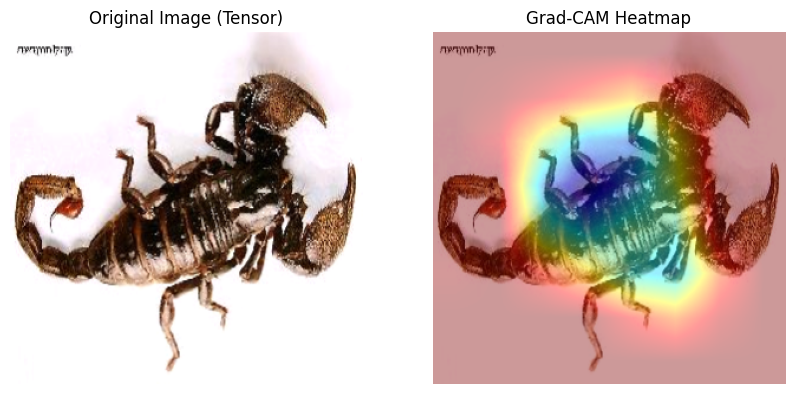

real label sea_horse
Detected Class: sea_horse


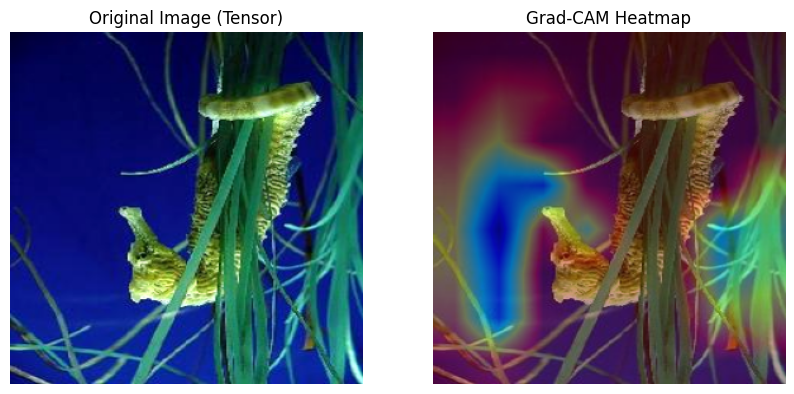

real label pagoda
Detected Class: pagoda


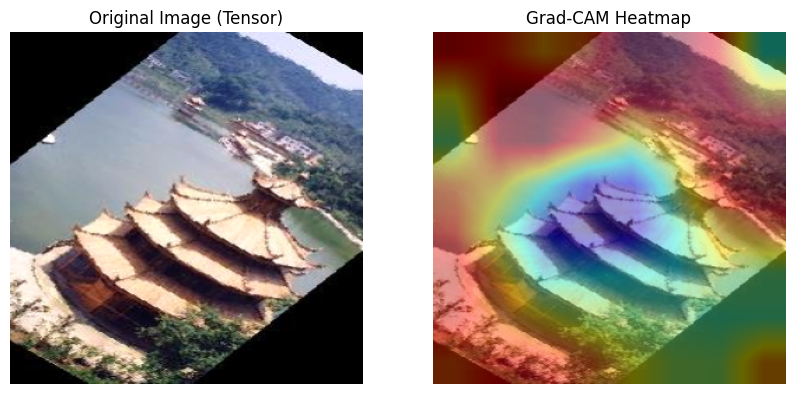

real label sea_horse
Detected Class: bonsai


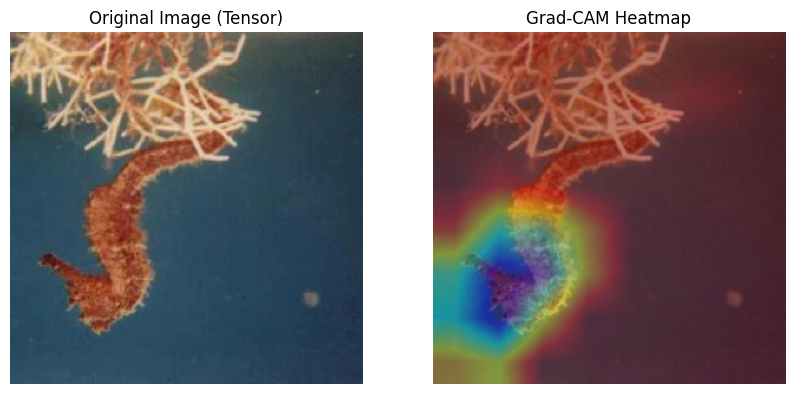

real label airplanes
Detected Class: airplanes


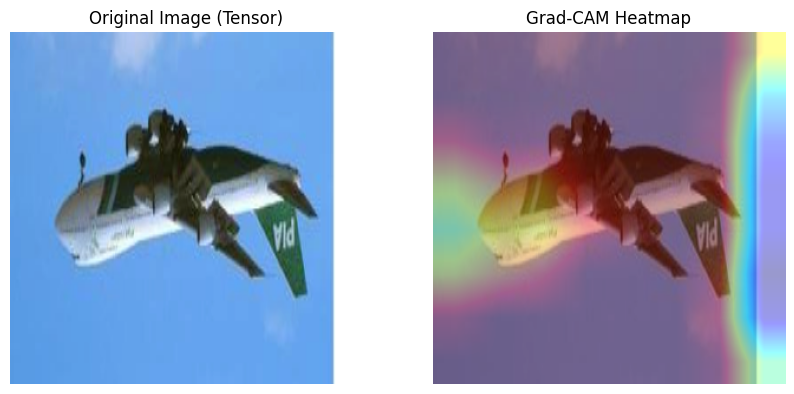

real label stapler
Detected Class: gramophone


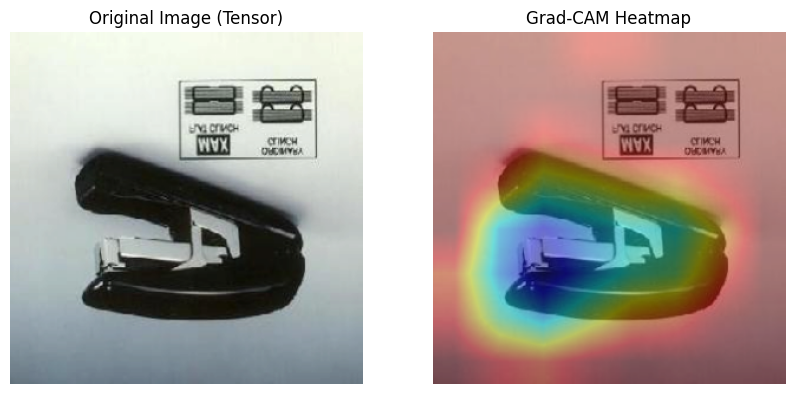

real label hawksbill
Detected Class: hawksbill


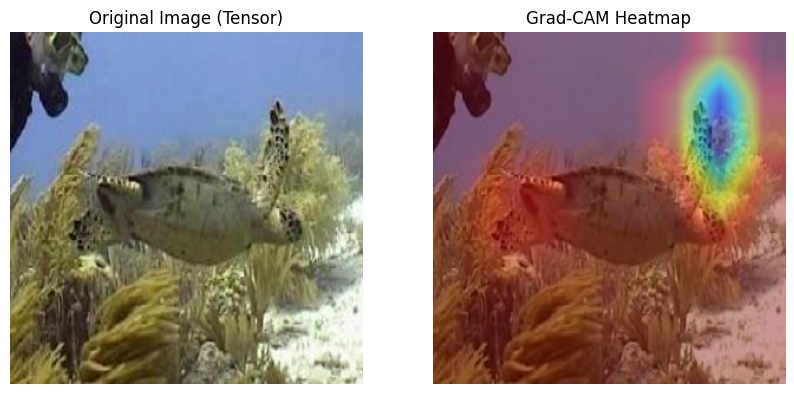

real label airplanes
Detected Class: airplanes


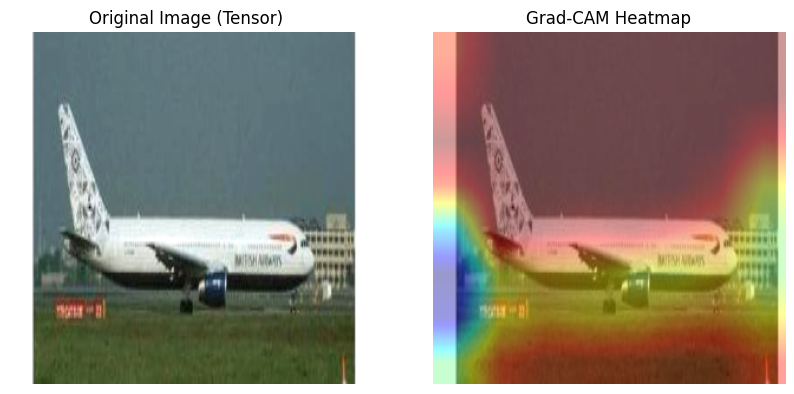

real label chandelier
Detected Class: menorah


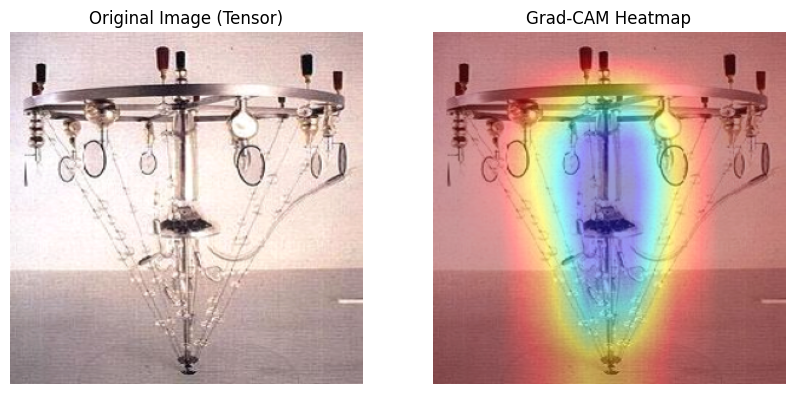

real label trilobite
Detected Class: trilobite


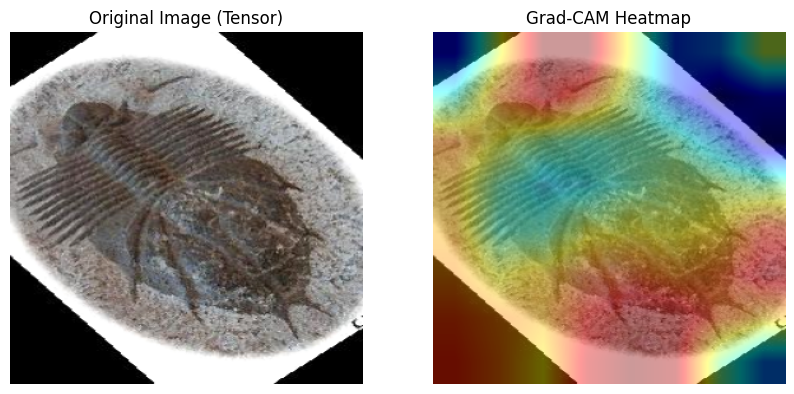

real label BACKGROUND_Google
Detected Class: BACKGROUND_Google


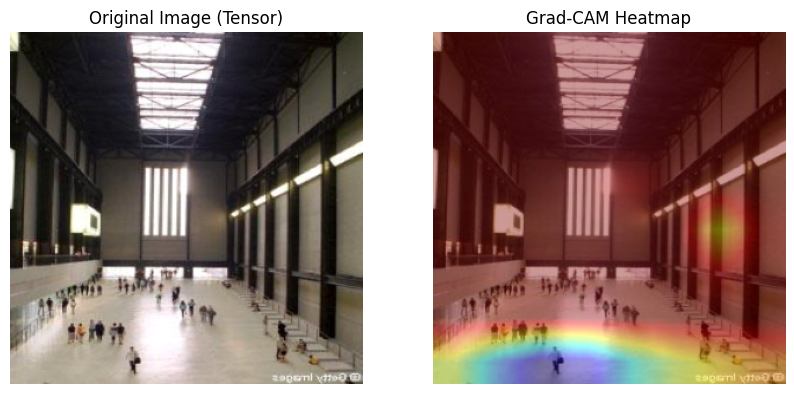

real label euphonium
Detected Class: euphonium


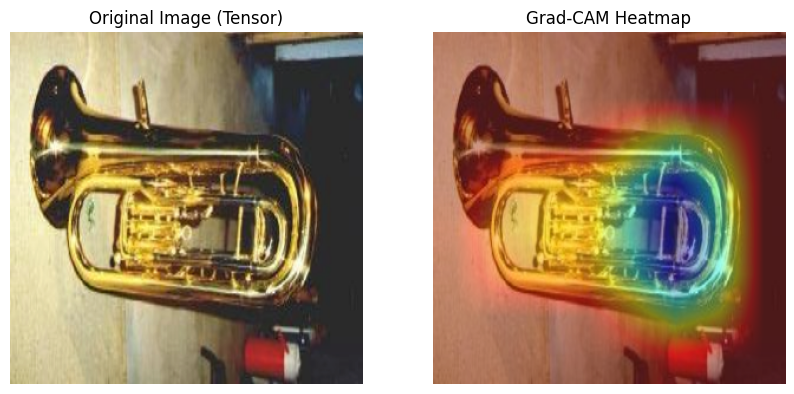

real label airplanes
Detected Class: airplanes


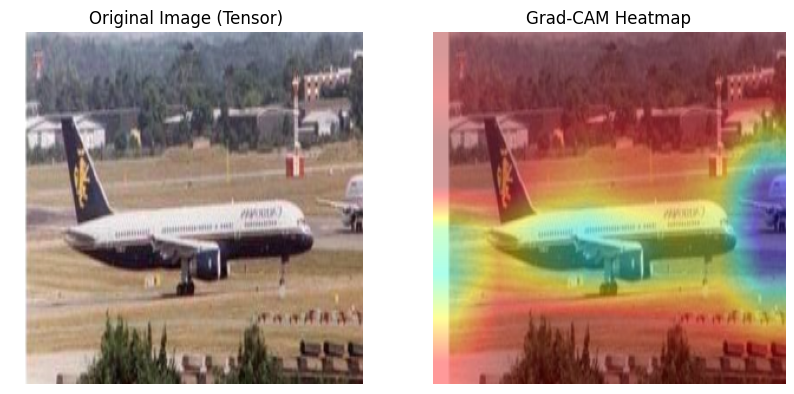

real label BACKGROUND_Google
Detected Class: chair


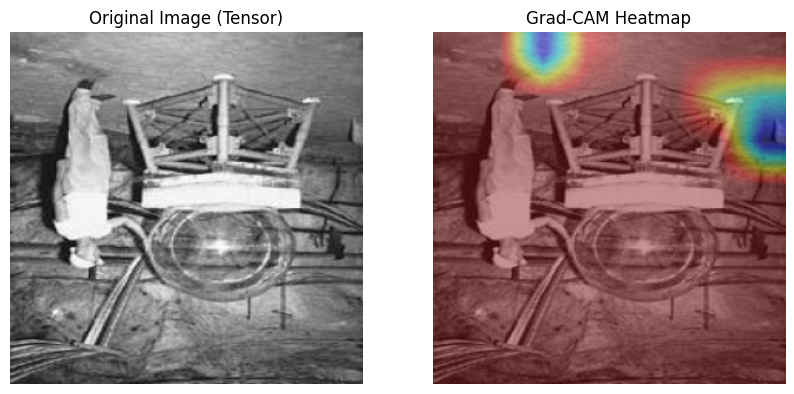

real label strawberry
Detected Class: strawberry


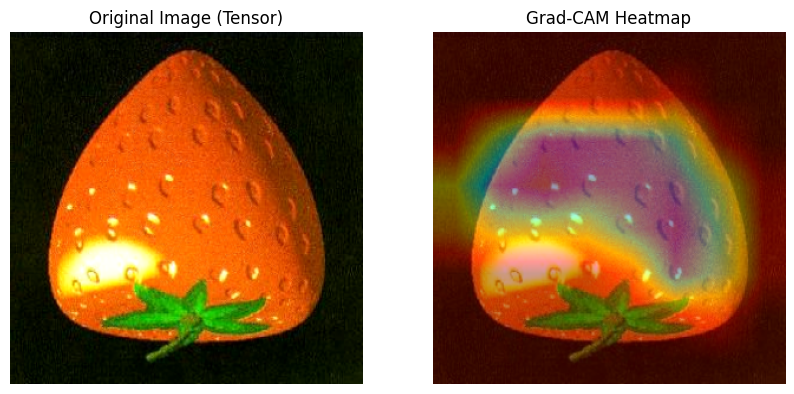

real label car_side
Detected Class: car_side


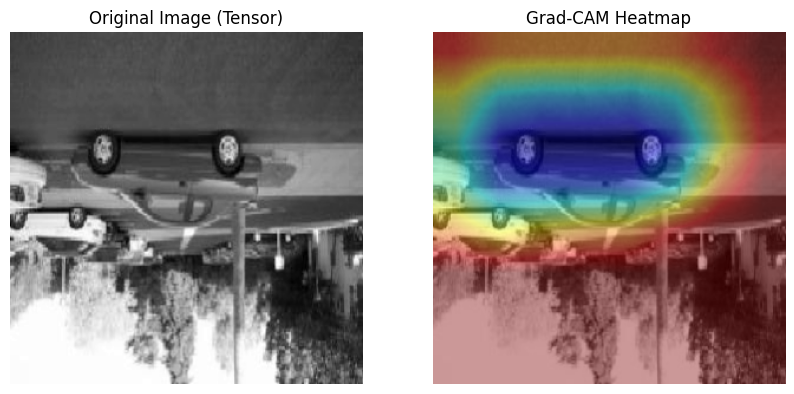

real label Motorbikes
Detected Class: Motorbikes


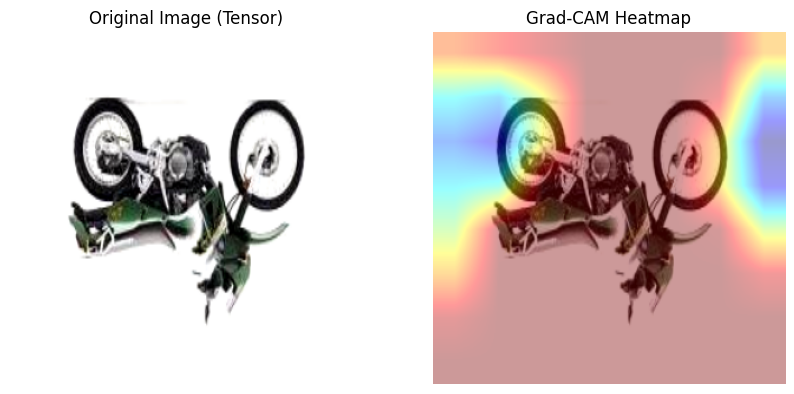

real label airplanes
Detected Class: airplanes


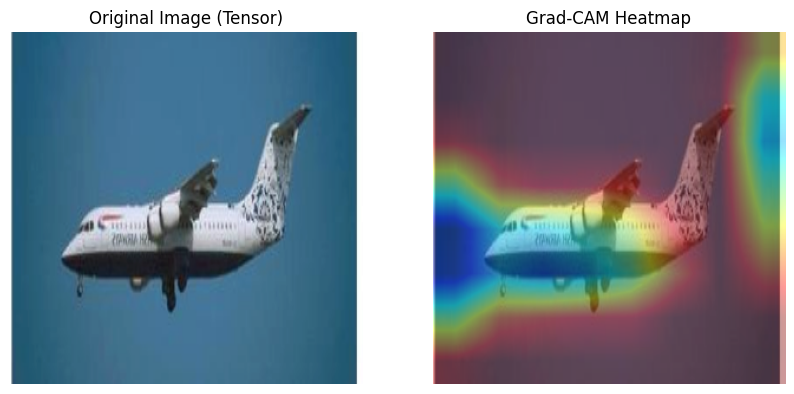

real label chair
Detected Class: chair


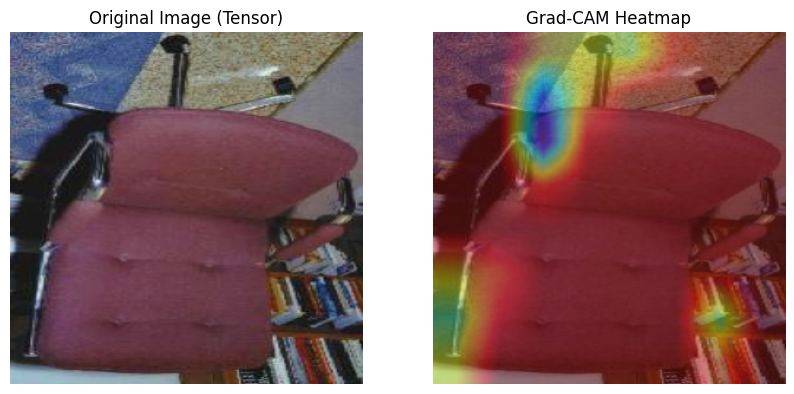

real label soccer_ball
Detected Class: soccer_ball


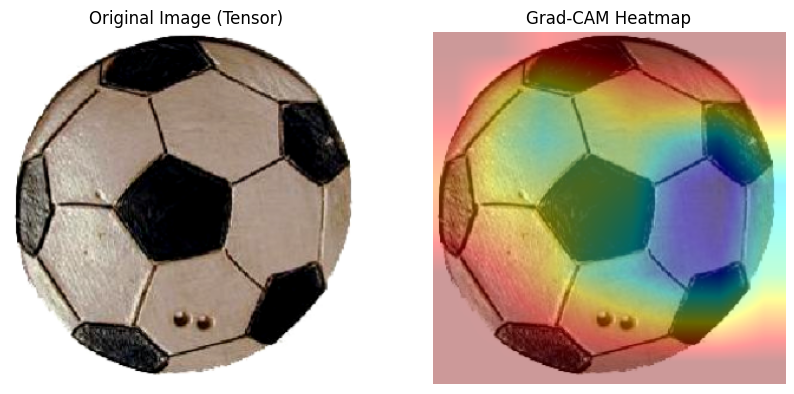

real label water_lilly
Detected Class: lotus


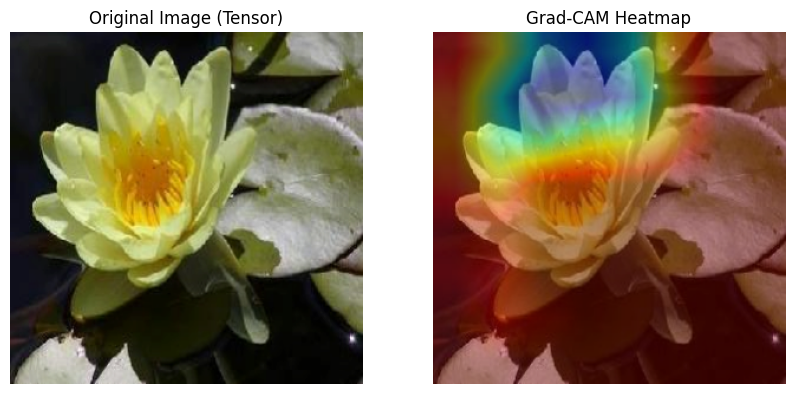

real label cup
Detected Class: barrel


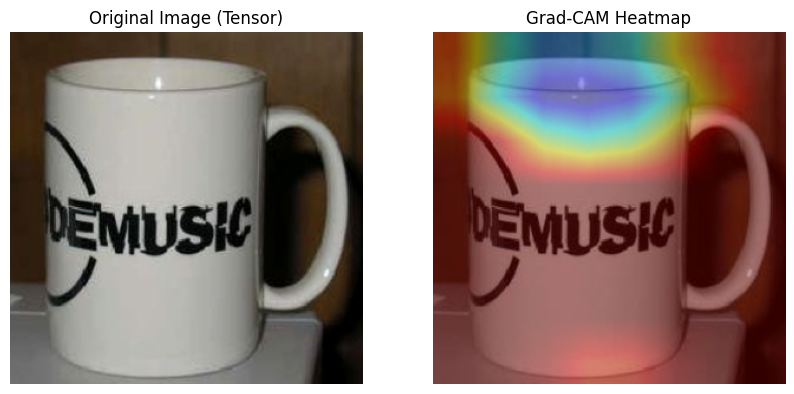

real label rhino
Detected Class: elephant


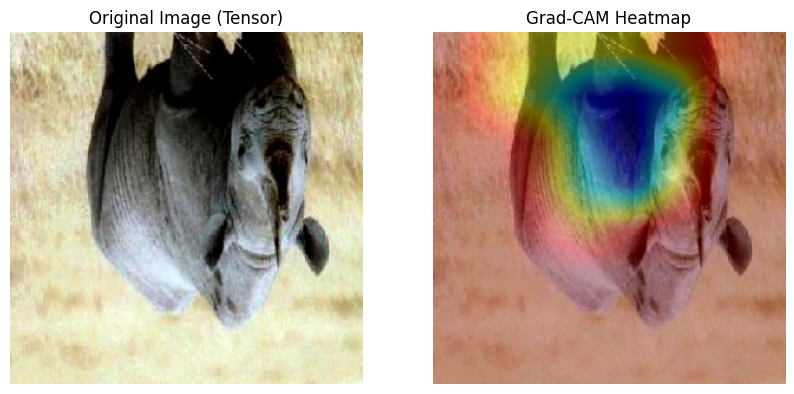

real label Faces
Detected Class: Faces


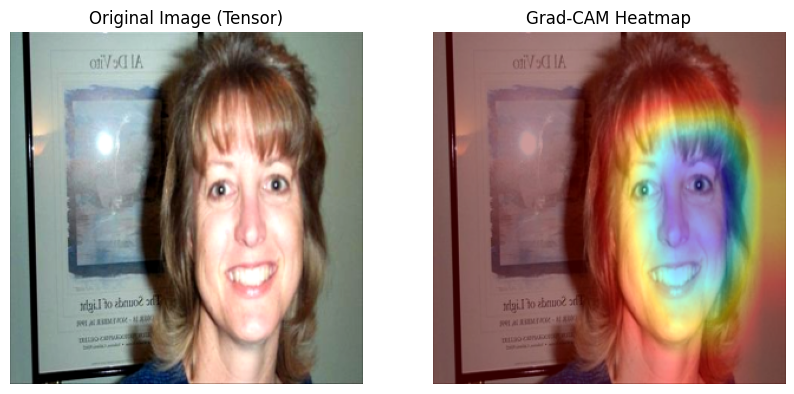

real label airplanes
Detected Class: airplanes


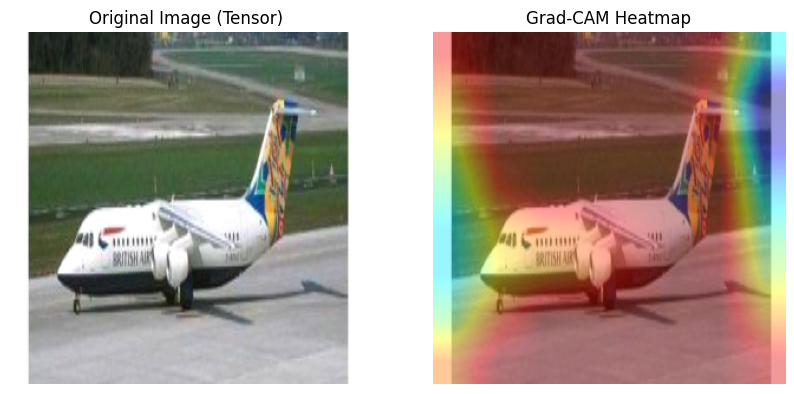

real label cellphone
Detected Class: cellphone


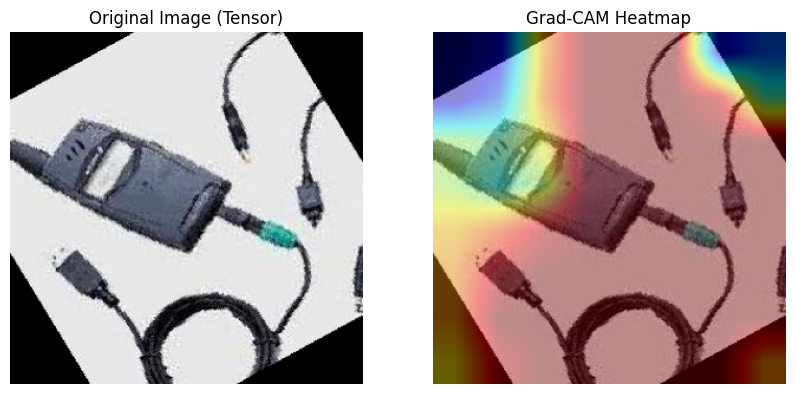

real label Faces_easy
Detected Class: Faces_easy


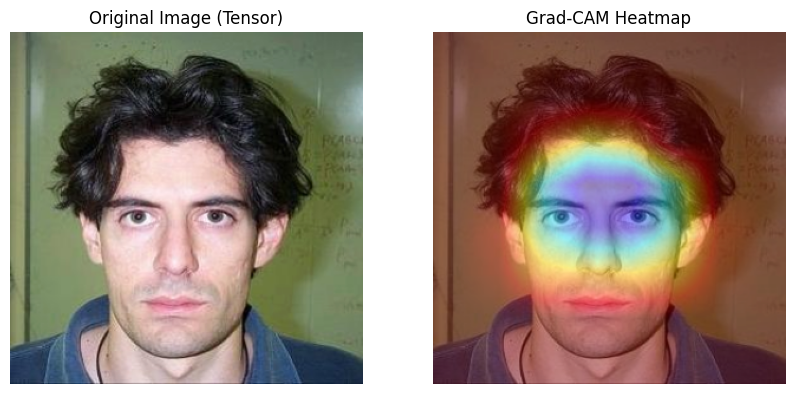

real label BACKGROUND_Google
Detected Class: BACKGROUND_Google


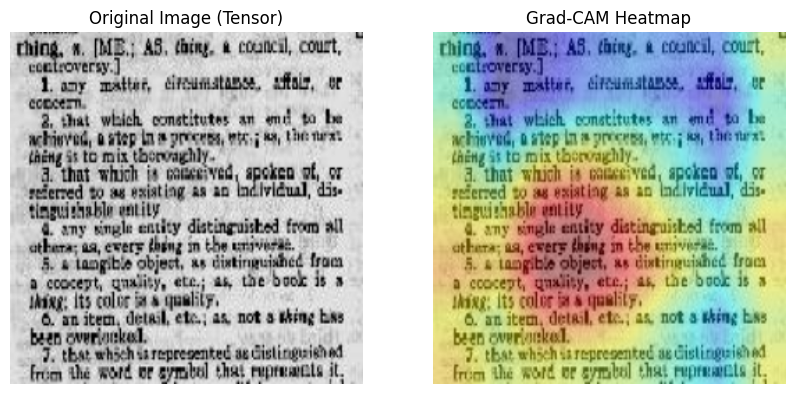

real label llama
Detected Class: llama


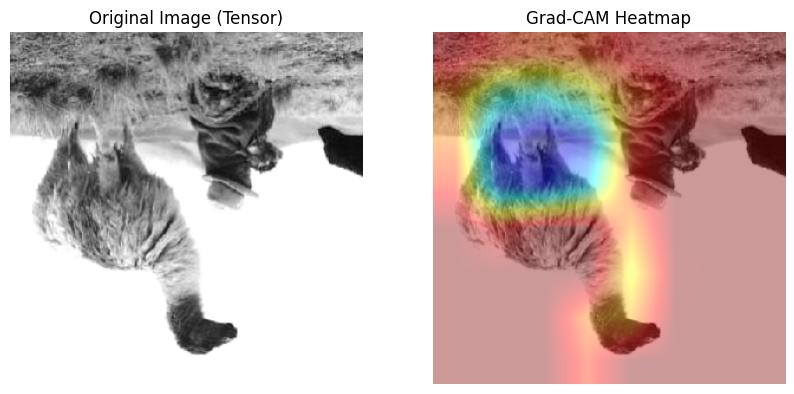

real label Motorbikes
Detected Class: Motorbikes


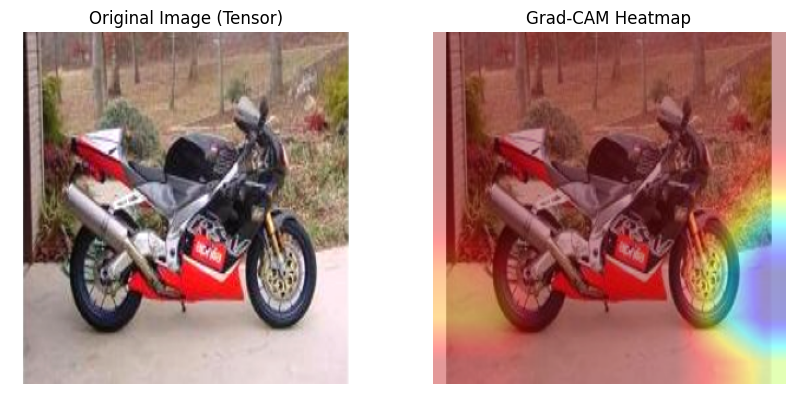

real label Faces_easy
Detected Class: Faces_easy


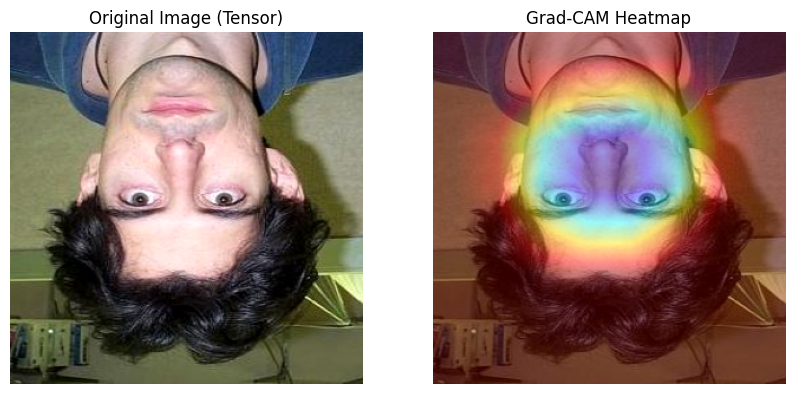

real label airplanes
Detected Class: airplanes


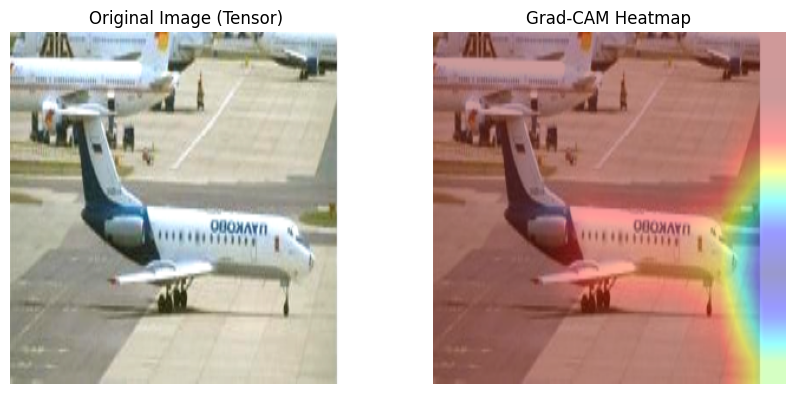

In [35]:
# 🔥 **Test with an Image**
for img, label in zip(imgs, labels):
    input_tensor = img.unsqueeze(0)  # Replace with your image path
    # 🔥 **Test with a Tensor**
    original_image = img # Remove batch dimension
    print( "real label", class_labels[int(label)])
    run_grad_cam_on_tensor(input_tensor, class_labels, original_image)


This grad cam logic helps us dive deeper into the model's stength, and weakness, as well as identify biases in out dataset.

4. What bias can you identify in our dataset that the grad cam enables us to pickup, and how could we solve this problem ?

We notice that pictures of airplanes and motorbikes have been identified correctly thanks to the picture borders, and not thanks to core pixels of the image. Which leads us to think perhaps our image base is not perfectly suited to our problem.

In order to solve this problem, we could either source new images, or use data augmentation in order to apply random zoom/crop to eliminate borders...